# Improve the milestone tracking's flowtime

In [2]:
import sys
sys.path.append('../')
from panav.env import NavigationEnv, Box2DRegion, box_2d_center, PolygonRegion
from panav.hybrid import HybridGraph
from panav.viz import draw_hybrid

from panav.TrafficAwarePlanning import traffic_aware_HG_plan
from panav.SAMP import Tube_Planning

import numpy as np
from matplotlib import pyplot as plt

%load_ext autoreload
%autoreload 2

## Empty environment

In [337]:

# 2D navigation environment

start_box_side = np.array([1,1])
goal_box_side = np.array([1,1])

limits = [(-10.0,10.0),(-10.0,10.0)]
# limits = [(-20.0,20.0),(-20.0,20.0)]

top, bottom = limits[1][1]*0.8,limits[1][0]*0.8

start_x_offset = abs(limits[0][0]) * 0.7
goal_x_offset = start_x_offset+2

N = 6

start_locs = np.vstack([
np.vstack([np.ones(N)*start_x_offset,np.linspace(top,bottom, N)]).T,
np.vstack([np.ones(N)*(-start_x_offset),np.linspace(top,bottom, N)]).T])

goal_locs = np.vstack([
np.vstack([np.ones(N)*(-goal_x_offset),np.linspace(bottom,top, N)]).T,
np.vstack([np.ones(N)*goal_x_offset,np.linspace(bottom,top, N)]).T])


starts = [box_2d_center(s,start_box_side) for s in start_locs]
goals = [box_2d_center(g,goal_box_side) for g in goal_locs]

# start = np.array(list(starts[0].centroid().coords)[0])
# goal = np.array(list(goals[0].centroid().coords)[0])


bloating_r = 0.5 
env = NavigationEnv(limits,[],starts,goals)

# Multi-tunnel Environment

In [338]:
y_min,y_max = min(limits[1]),max(limits[1])
n_tunnel = 3
w = 2.5*bloating_r # Tunnel width
s = (y_max-y_min-w*n_tunnel)/(n_tunnel+1) # Spacing between tunnels

d = 5 # Thickness of the wall

obstacles = []
for i in range(n_tunnel+1):
    side = np.array([d,s])
    center = np.array([0, y_max-s/2-i*(s+w)])
    obstacles.append(box_2d_center(center,side))
env.obstacles = obstacles



/Users/tianpengzhang/opt/miniconda3/envs/PA-Nav/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


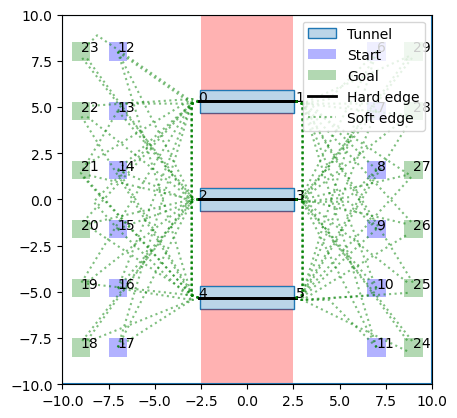

In [339]:
HG = HybridGraph(env,bloating_r)
ax = plt.gca()
draw_hybrid(HG,ax,display_soft=True,display_node=True)
plt.show()    


In [357]:
paths = traffic_aware_HG_plan(HG,consider_soft_traffic=False)

In [358]:
paths

[[6, 3, 2, 18],
 [7, 3, 2, 19],
 [8, 3, 2, 20],
 [9, 3, 2, 21],
 [10, 3, 2, 22],
 [11, 3, 2, 23],
 [12, 0, 1, 24],
 [13, 0, 1, 25],
 [14, 0, 1, 26],
 [15, 4, 5, 27],
 [16, 4, 5, 28],
 [17, 4, 5, 29]]

In [290]:
from panav.PBS.PBS import PBS
continuous_plans,_=PBS(env,vmax=1.0,bloating_r=0.5)

In [351]:
from panav.SAMP_class.solvers import Path_Tracking,Tube_Planning
from panav.SAMP import milestone_tracking
vmax = 1.0
continuous_plans = []

for i,path in enumerate(paths):
    print("Planning for {}/{}".format(i,len(paths)))
    start = HG.node_loc(path[0])
    goal = HG.node_loc(path[-1])
    
    milestones = np.array([HG.node_loc(u) for u in path[1:-1]]).T
    solver = Path_Tracking(env,start,goal,
                        milestones=milestones,max_dev=0.2,vmax=vmax,bloating_r=bloating_r)

    # solver = Tube_Planning(env,start,goal)
    p = solver.lazy_plan(obstacle_trajectories=continuous_plans)    
    continuous_plans.append(p)


Planning for 0/12
Planning for 1/12
Planning for 2/12
Planning for 3/12
Planning for 4/12
Planning for 5/12
Planning for 6/12
Planning for 7/12
Planning for 8/12
Planning for 9/12
Planning for 10/12
Planning for 11/12


In [286]:

def flowtime(plan):
    return np.sum([t[-1] for t,x in plan])
def makespan(plan):
    return np.max([t[-1] for t,x in plan])

In [342]:
flowtime(continuous_plans)

373.1882398738088

In [343]:
makespan(continuous_plans)

36.96659831482702

In [352]:
flowtime(continuous_plans)

371.7500678463082

In [353]:
makespan(continuous_plans)

45.695173179565465

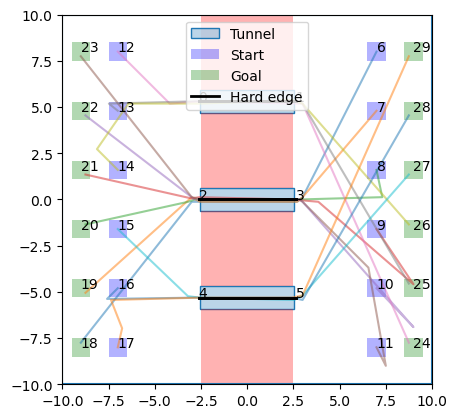

In [354]:
draw_hybrid(HG,ax=plt.gca(),paths = [o[1] for o in continuous_plans if o])

In [314]:
from panav.viz import animation,interpolate_positions

from IPython.display import HTML, display
interp_dt = 0.1

pos = []
for cp in continuous_plans:
    _,xs = interpolate_positions(*cp,interp_dt)
    pos.append(xs)

anim = animation(env, pos, bloating_r, dt = interp_dt / 4)
display(HTML(anim.to_jshtml()))
plt.close()   # Avoid plotting an extra figure.